## Audio analysis of a guitar melody

In this notebook, I will load do the following: 
- audio data
- plot spectrograms manually and compare with librosa
- Take slices of audio
- plot mel spectrogram

In [20]:
from IPython.display import Audio
from matplotlib import pyplot as plt 
from scipy.signal import spectrogram
import numpy as np
from scipy import signal
import librosa
from scipy.io import wavfile

from scipy.signal import find_peaks
from scipy.signal import butter, lfilter
from scipy.signal import filtfilt, fftconvolve, freqz, firwin2, hilbert

plt.rcParams['figure.figsize'] = [20, 5]
plt.rcParams['font.size'] = 12
plt.rcParams['legend.fontsize'] = 'large'
plt.rcParams['figure.titlesize'] = 'medium'

## play the music

In [21]:
path_clean = 'test.wav'
Audio(path_clean)

## load the data

In [22]:
def get_wav_info(wav_file):
    rate, data = wavfile.read(wav_file)
    print('The sample rate is {}'.format(rate))
    duration = len(data)/float(rate)
    return data[:, 0], rate, duration # i am returning 1st col because i forgot to export as mono


## Get some info on the audio

In [23]:
data, rate, duration = get_wav_info(path_clean)
print("Sample rate  :", rate)
print("Signal Length:", len(data))
print("Duration     :", len(data)/rate, "seconds")

The sample rate is 44100
Sample rate  : 44100
Signal Length: 884635
Duration     : 20.059750566893424 seconds


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  


## Plot the audio waveform

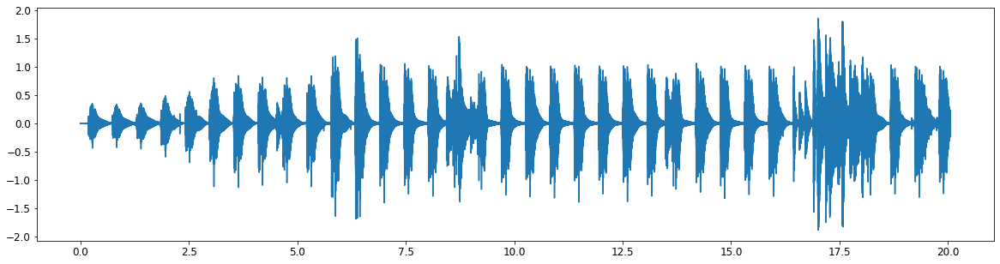

In [24]:
t = np.arange(len(data))/float(rate)
plt.plot(t, data)

## Lets pick out the melody at the end

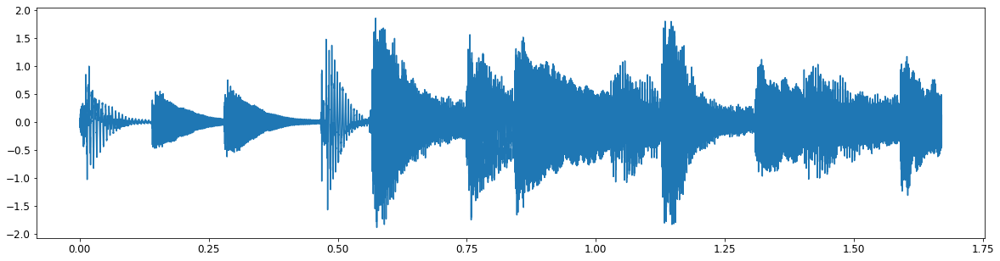

In [25]:
# get the first 3 seconds and plot
inds = np.arange(int(16.43*rate), int(18.1*rate))
time = np.arange(len((inds)))/float(rate)
audio_chunk = np.array(data[inds])

plt.figure(figsize=(20,5))
plt.plot(time, audio_chunk)

## Lets play it

In [26]:
Audio(data=audio_chunk, rate=rate)

## lets find out what frequencies are present in the signal

In [73]:
def get_psd(data, rate):
    fhat = np.fft.fft(data)
    n = len(data)
    ps = fhat[:n//2+1]
    ps = (1/(rate*n))*abs(ps)**2
    ps[1:-1] = 2*ps[1:-1]
    freq = np.arange(0, rate/2, rate/n)
    return freq, ps, fhat

Text(0, 0.5, 'dB')

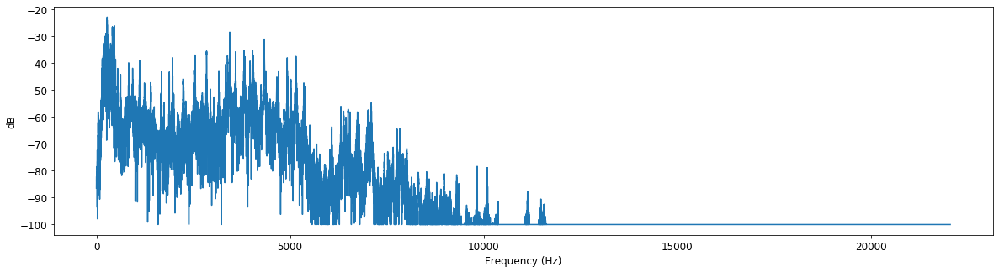

In [76]:
freq, ps, _ = get_psd(audio_chunk, rate)
plt.plot(freq, librosa.power_to_db(ps))
plt.xlabel('Frequency (Hz)')
plt.ylabel('dB')

# apply IDFT to log power spectrum to get cepstrum. Cepstrum is used to detect 1st harmonic/pitch

In [82]:
s = np.fft.ifft(ps)

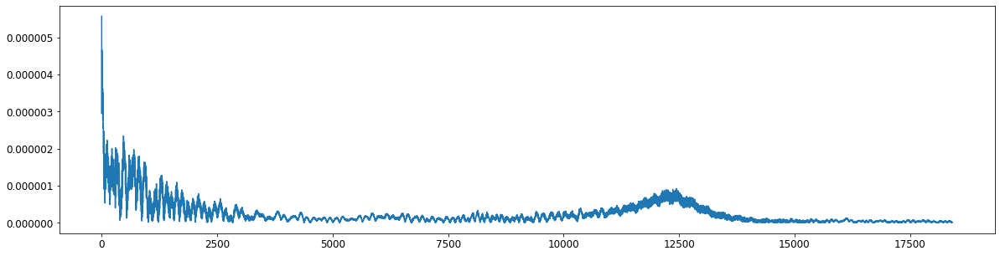

In [83]:
plt.plot(abs(s[:len(s)//2]))

In [85]:
mfccs = librosa.feature.mfcc(audio_chunk, n_mfcc=13, sr=rate)

In [86]:
mfccs.shape

(13, 144)

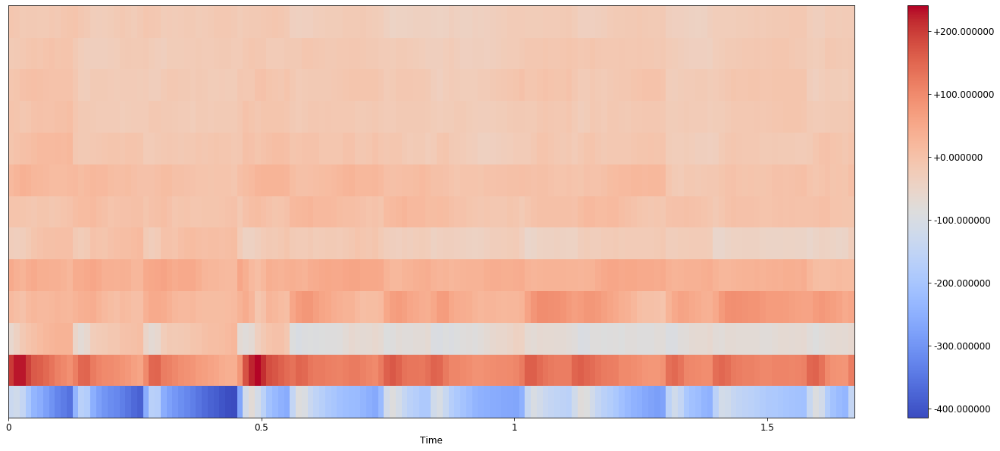

In [89]:
plt.figure(figsize=(25, 10))
librosa.display.specshow(mfccs, x_axis="time", sr=rate)
plt.colorbar(format="%+2f")

In [91]:
# calculate delta and delta2 MFCCs
delta_mfccs = librosa.feature.delta(mfccs)
delta2_mfccs = librosa.feature.delta(mfccs, order=2)

In [92]:
delta_mfccs.shape

(13, 144)

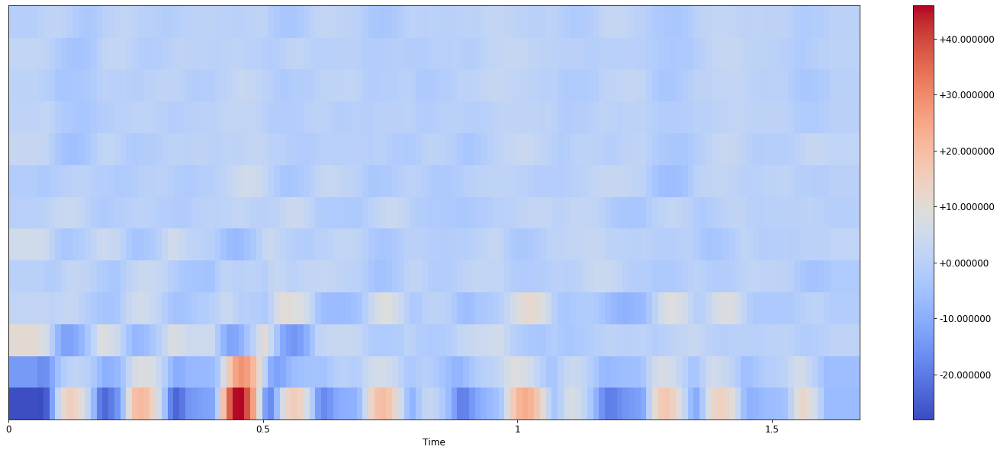

In [93]:
plt.figure(figsize=(25, 10))
librosa.display.specshow(delta_mfccs, x_axis="time", sr=rate)
plt.colorbar(format="%+2f")

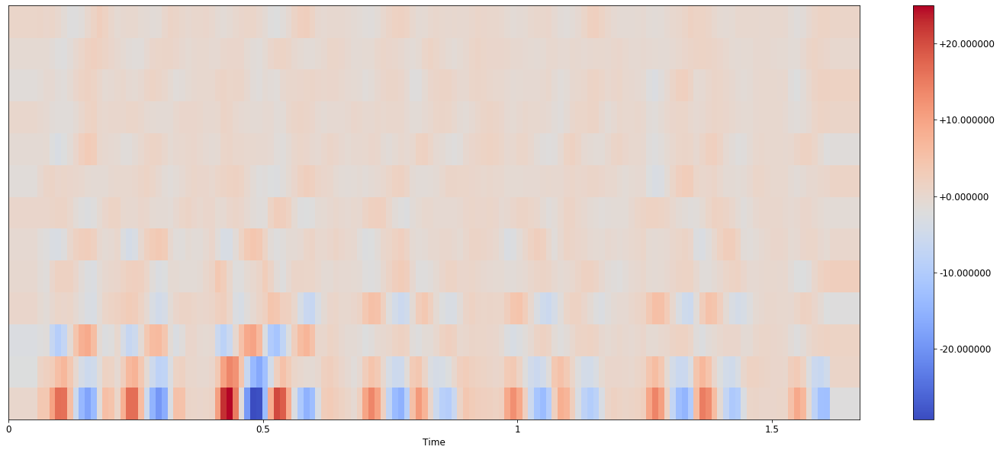

In [94]:
plt.figure(figsize=(25, 10))
librosa.display.specshow(delta2_mfccs, x_axis="time", sr=rate)
plt.colorbar(format="%+2f")

In [98]:
comprehensive_mfccs = np.concatenate((mfccs, delta_mfccs, delta2_mfccs))
comprehensive_mfccs.shape

(39, 144)

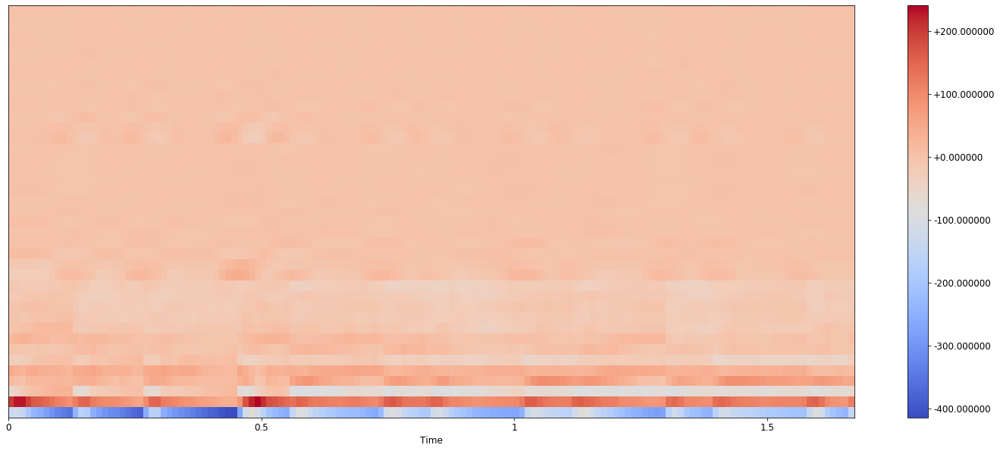

In [99]:
plt.figure(figsize=(25, 10))
librosa.display.specshow(comprehensive_mfccs, x_axis="time", sr=rate)
plt.colorbar(format="%+2f")

#  Spectrogram
## Another way to look at the frequency content of the melody is to plot a spectrogram
a spectrogram splits the signal into overlapping frames, each of which have had a window function applied to them and an fft. Each frame tells us how much energy is present at each frequency as a function of time.

We will get the spectrogram manually and compare to a popular audio analysis framework called Librosa.

- typically frame size is 20 - 40 ms = 0.025 s
- the overlap of adjacent frames is 50% = 0.015 s
- nfft = power of 2 or 256 or 512
- hop size = nperseg - noverlap

![title](img/stft.png)

Text(0.5, 0, 'Time')

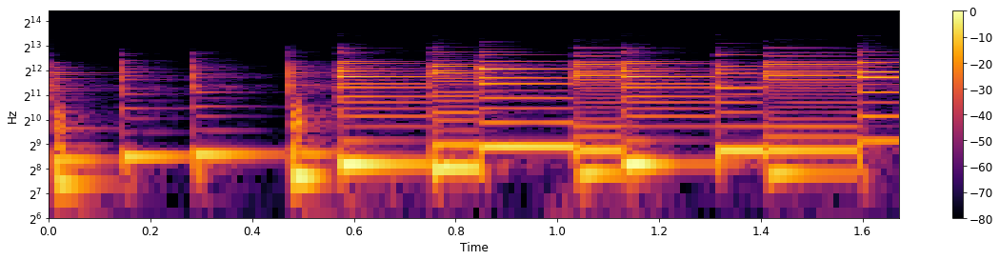

In [30]:
# typically frame size is 20 - 40 ms = 0.025 s
# overlap is 50% = 0.015 s
# nfft = power of 2 or 256 or 512
# hop size = nperseg - noverlap
plt.figure(figsize=(20, 4))
f, t, Zxx = signal.stft(audio_chunk, rate, nperseg=1024, noverlap=512)
Zxx = librosa.amplitude_to_db(np.abs(Zxx), ref=np.max)
spec = plt.pcolormesh(t, f, (Zxx), cmap='inferno')
plt.yscale('symlog', basey=2)
plt.ylim(64, f[-1])
plt.colorbar()
plt.ylabel('Hz')
plt.xlabel('Time')

The y-axis is converted to a log scale, and the color dimension is converted to decibels (you can think of this as the log scale of the amplitude). This is because humans can only perceive a very small and concentrated range of frequencies and amplitudes.

# the corresponding librosa spectrogram

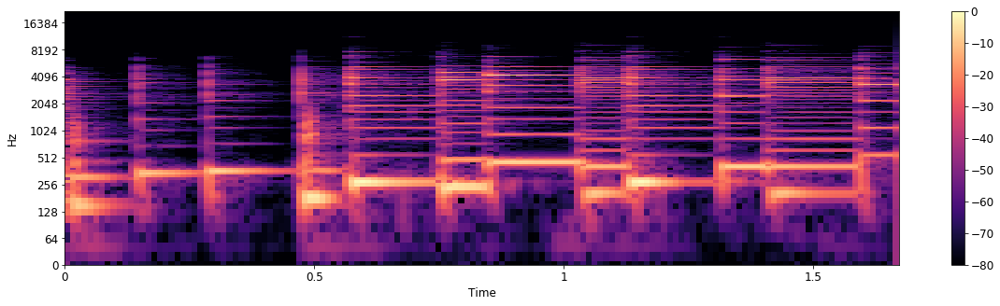

In [31]:
import librosa.display
hop_length = 512

D = librosa.amplitude_to_db(np.abs(librosa.stft(audio_chunk)),

                            ref=np.max)

img = librosa.display.specshow(D, y_axis='log', sr=rate,

                         x_axis='time')


plt.colorbar(img)

# What can we do with this spectrogram?
## spectral centroid
we can get the spectral centroid in each frame and then pick out note onsets by finding peaks in the spectral centroid plot

Each frame of a magnitude spectrogram is normalized and treated as a
distribution over frequency bins, from which the mean (centroid) is
extracted per frame

In [34]:
# spectral centroid
#weighted mean of the frequency bins
D2 = librosa.db_to_power((D))
# spectral_centroid = np.zeros((D.shape[1], 1))
# print(spectral_centroid.shape)
# frequencies = np.linspace(0,
#                        float(rate) / 2,
#                        int(1 + 1024),
#                        endpoint=True)

# # go through each column, divide by the total energy across all freqs
# # take the sum of the normalized spectrum where each energy value is weighted
# # by the frequency bin
# for i in range(D.shape[1]):
#     normalized_spectrum = D[:, i] / np.sum(D[:, i])  # like a probability mass function
#     spectral_centroid[i] = np.sum(frequencies*normalized_spectrum)

    


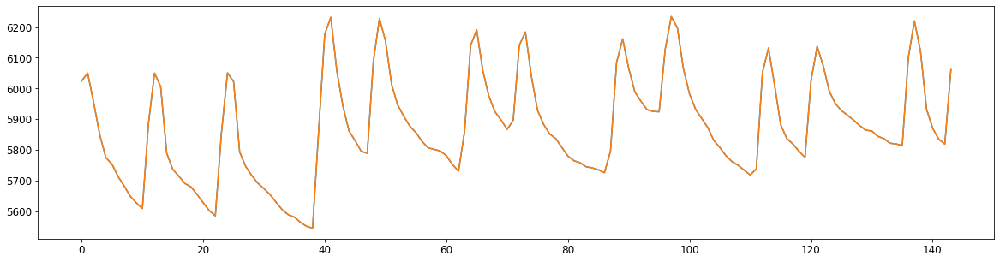

In [35]:
cent = librosa.feature.spectral_centroid(S=np.abs(D))[0]
plt.plot(cent.T)
plt.plot(spectral_centroid/2)



# plot the spectral centroid along the with the waveform

In [36]:
import sklearn
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

In [37]:
cent = cent.squeeze()
frames = range(len(cent.T))
t = librosa.frames_to_time(frames)/2
print(max(cent))


6234.161361847371


# note onsets with findpeaks

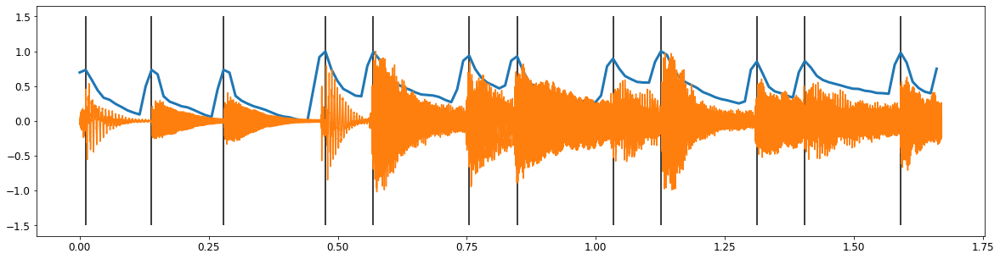

In [260]:
peaks, _ = find_peaks(normalize(cent), height=0.2)

plt.plot(t, normalize(cent), linewidth=3)
plt.plot(time, audio_chunk/max(audio_chunk))
plt.vlines(t[peaks], ymin=-1.5, ymax=1.5)


# Spectral bandwidth
Variance around the spectral centroid
This characterizes how spread out the energy is across the different frequency bands
${(\sum_k S[k] * (freq[k] - centroid)^p)}^{(1/p)}$

Can be used to detect the individual notes. A note is detected each time the spectral bandwidth falls below a defined threshold.

In [248]:
spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(audio_chunk, sr=rate)[0]

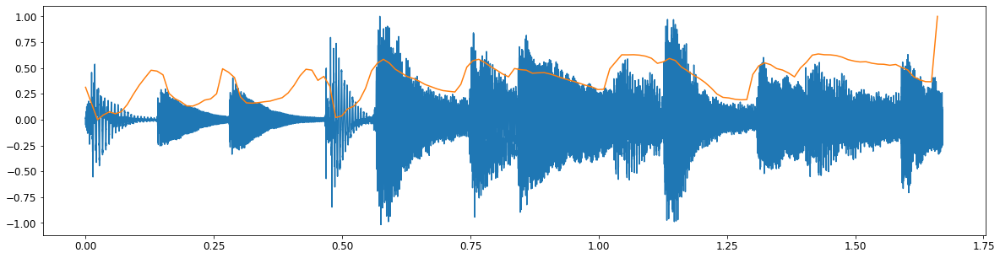

In [250]:
plt.plot(time, audio_chunk/max(audio_chunk))
plt.plot(t, normalize(spectral_bandwidth_2))

# The MEL scale

The Mel Scale is the result of some non-linear transformation of the frequency scale. This Mel Scale is constructed such that sounds of equal distance from each other on the Mel Scale, also “sound” to humans as they are equal in distance from one another.
In contrast to Hz scale, where the difference between 500 and 1000 Hz is obvious, whereas the difference between 7500 and 8000 Hz is barely noticeable.

![title](img/MEL.png)

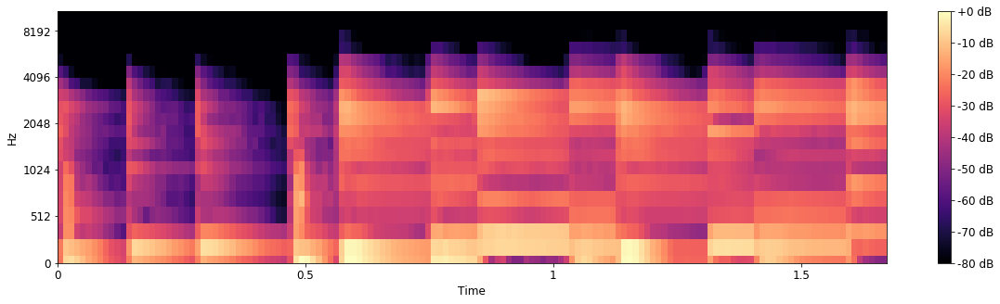

In [35]:
n_mels = 20
S = librosa.feature.melspectrogram(audio_chunk, sr=rate, n_fft=1024, n_mels=n_mels)
S_DB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_DB, sr=rate, hop_length=hop_length, x_axis='time', y_axis='mel');
plt.colorbar(format='%+2.0f dB');

# What the hell is this and how do we obtain it?

In [9]:
def hz2mel(hz):
    """Convert a value in Hertz to Mels
    :param hz: a value in Hz. This can also be a numpy array, conversion proceeds element-wise.
    :returns: a value in Mels. If an array was passed in, an identical sized array is returned.
    """
    return 2595 * np.log10(1 + hz / 700.0)

In [10]:
def mel2hz(mel):
    """Convert a value in Mels to Hertz
    :param mel: a value in Mels. This can also be a numpy array, conversion proceeds element-wise.
    :returns: a value in Hertz. If an array was passed in, an identical sized array is returned.
    """
    return 700 * (10 ** (mel / 2595.0) - 1)

# we want to take our min frequency and the Nyquist frequency (sample rate / 2) and create a vector of evenly-spaced mel-frequencies

In [11]:
# compute points evenly spaced in mels
lowfreq, highfreq = 0, rate / 2
n_mel = 20

# convert from frequency to MEL
lowmel = hz2mel(lowfreq)
highmel = hz2mel(highfreq)

# make n_mel equally-spaced MEL bands
# mel points are center frequencies of triangular filters
melpoints = np.linspace(lowmel, highmel, n_mel + 2)

print(np.round(mel2hz(melpoints)))


[    0.   126.   275.   451.   659.   904.  1193.  1534.  1937.  2412.
  2973.  3635.  4417.  5340.  6429.  7714.  9231. 11022. 13136. 15630.
 18575. 22050.]


# create the frequency bins by converting from mel to Hz

In [12]:
nfft = 1024
# round to the nearest frequency bin using floor
bin = np.floor((nfft + 1) * (mel2hz(melpoints)) / rate)
print(bin)

[  0.   2.   6.  10.  15.  20.  27.  35.  45.  56.  69.  84. 102. 124.
 149. 179. 214. 256. 305. 363. 431. 512.]


In [15]:
%%capture
# create triangular filters
fbank = np.zeros([n_mel, nfft // 2])
for j in range(0, n_mel):
    for i in range(int(bin[j]), int(bin[j + 1])):
        fbank[j, i] = (i - bin[j]) / (bin[j + 1] - bin[j])
    for i in range(int(bin[j + 1]), int(bin[j + 2])):
        fbank[j, i] = (bin[j + 2] - i) / (bin[j + 2] - bin[j + 1])
        
# normalize so that filters at higher frequencies have a smaller weight. This will mean that high frequencies will be 
# filtered out more than low ones. This makes sense because we percieve low frequencies better than high ones
mel_filter = fbank.T / fbank.sum(axis=1)

# plot the MEL filter bank

Text(0, 0.5, 'Weight')

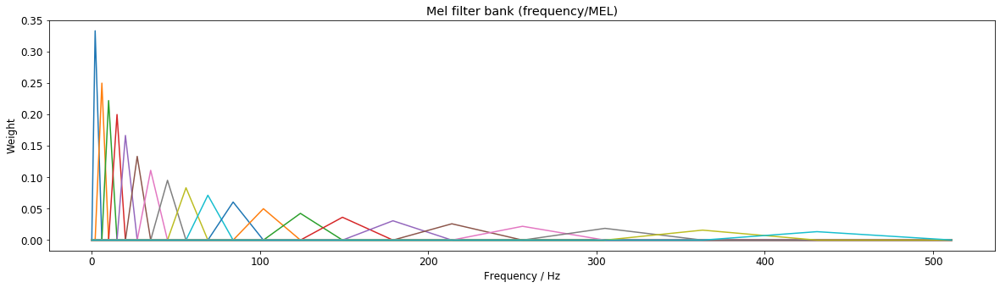

In [16]:
plt.plot(mel_filter)
plt.title('Mel filter bank (frequency/MEL)')
plt.xlabel('Frequency / Hz')
plt.ylabel('Weight')

# you can get teh same thing using Librosa

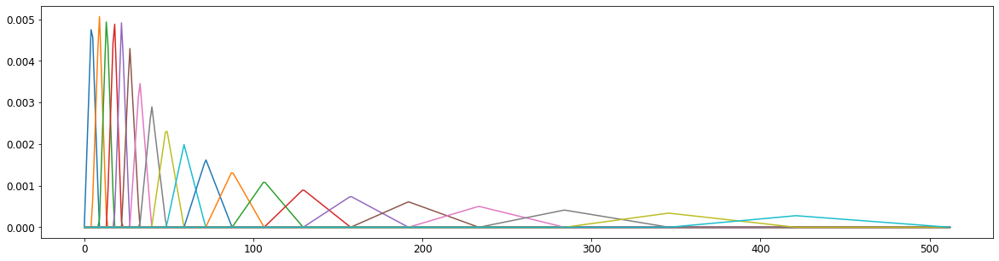

In [18]:

melfb = librosa.filters.mel(sr=rate, n_fft=1024, n_mels=20)
plt.plot(melfb.T);

# multiply the spectrogram by the filters in the frequency domain to get thge MEL spectrogram

In [19]:
mel_spec = (mel_filter).dot((Zxx))
mel_spec = mel_spec[:, 1:-1]

NameError: name 'Zxx' is not defined

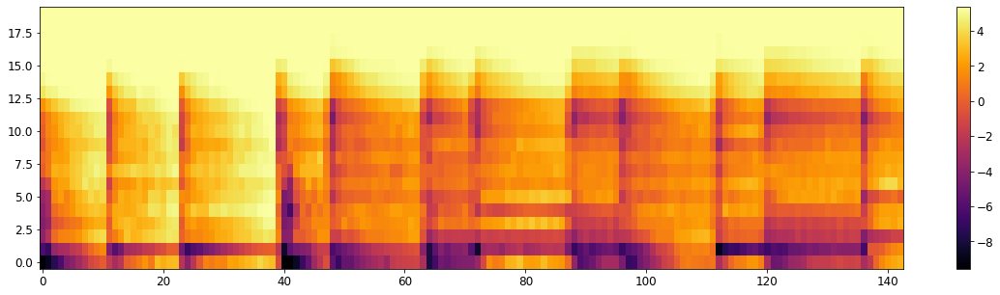

In [50]:
plt.imshow(librosa.amplitude_to_db(np.abs(mel_spec)), origin='lower', aspect='auto', cmap='inferno')
plt.colorbar()

# Conclusion

The MFCC is a good algorithm to extract high frequency and low frequency information.

# Now we can feed this MEL spec into a convolutional neural network layer, which will learn to extract spectral profiles in a given frame. An LSTM layer will learn make predictions about the spectral profile in a given frame based on the profile in prior time frames. As the network trains, the convolutional weights will be updated to pick out these short- and long-time relationships between frames